In [1]:
import torch
from torch import nn
from typing import Any, Union, List, Tuple
import numpy as np
from scipy import linalg
import matplotlib.pyplot as plt

def _nn_autograd(model: torch.nn.Module,
                     points: torch.Tensor,
                     var: int,
                     axis: List[int] = [0]):
        """ Computes derivative on the grid using autograd method.

        Args:
            model (torch.nn.Module): torch neural network.
            points (torch.Tensor): points, where numerical derivative is calculated.
            var (int): number of dependent variables (for single equation is *0*)
            axis (list, optional): term of differentiation, example [0,0]->d2/dx2
                                   if grid_points(x,y). Defaults to [0].

        Returns:
            gradient_full (torch.Tensor): the result of desired function differentiation
                in corresponding axis.
        """

        points.requires_grad = True
        fi = model(points)[:, var].sum(0)
        for ax in axis:
            grads, = torch.autograd.grad(fi, points, create_graph=True)
            fi = grads[:, ax].sum()
        gradient_full = grads[:, axis[-1]].reshape(-1, 1)
        return gradient_full


In [2]:
import torch

if torch.cuda.is_available():
    device = torch.device("cuda")
    print("CUDA доступен")
else:
    device = torch.device("cpu")
    print("CUDA недоступен, используется CPU")


CUDA доступен


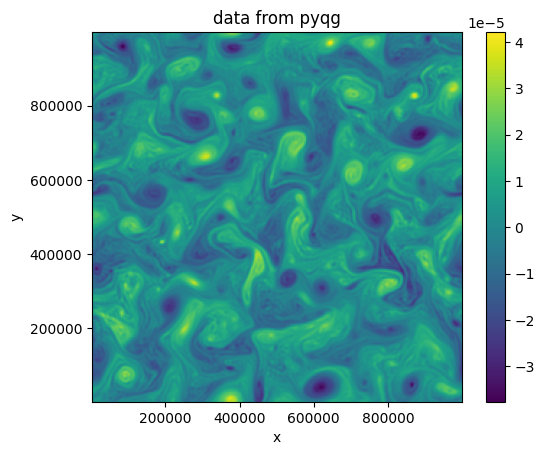

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Загрузка данных
x = np.load('x_eddy_noforce_q.npy')
y = np.load('y_eddy_noforce_q.npy')
data = np.load('data_eddy_noforce_q.npy')
# Визуализация данных
plt.title('data from pyqg')
plt.xlabel('x')
plt.ylabel('y')
plt.imshow(data, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
plt.colorbar()
plt.show()


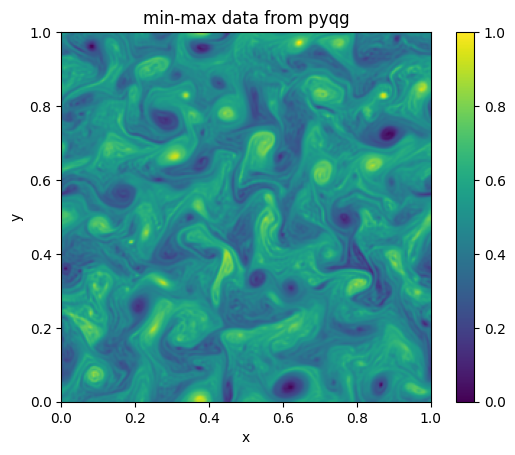

In [4]:
# Масштабирование сетки от 0 до 1
x = (x - np.min(x)) / (np.max(x) - np.min(x))
#print(x)

y = (y - np.min(y)) / (np.max(y) - np.min(y))
#print(y)

#масштабирование данных до 0 до 1
data = (data - np.min(data)) / (np.max(data) - np.min(data))
#print(data)

#print(x.shape)
#print(y.shape)

# Визуализация данных
plt.title('min-max data from pyqg')
plt.xlabel('x')
plt.ylabel('y')
plt.imshow(data, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
plt.colorbar()
plt.show()

[[ 0.02316669  0.05617945  0.07253653 ... -0.04367334 -0.01949023
  -0.00245881]
 [ 0.00160037  0.06605578  0.05237163 ... -0.02289167 -0.03786763
  -0.05091265]
 [-0.05974562 -0.01624123 -0.03752724 ... -0.03858335 -0.05618323
  -0.08677936]
 ...
 [-0.07302445  0.00718571  0.02844714 ... -0.2162717  -0.22599467
  -0.17668324]
 [ 0.01550637  0.03811107  0.03953282 ... -0.25174651 -0.15629443
  -0.05445814]
 [ 0.03774755  0.02698236  0.03861136 ... -0.14837184 -0.04608813
   0.02629253]]


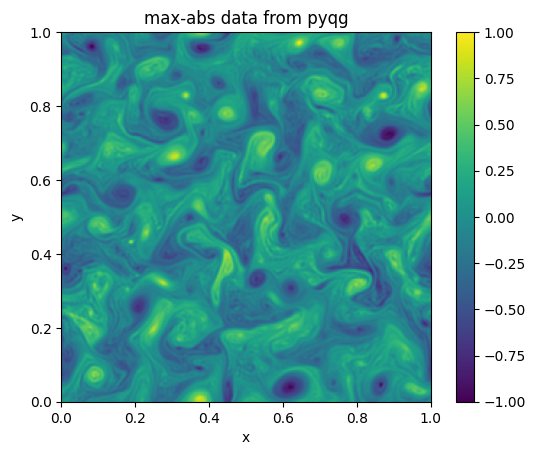

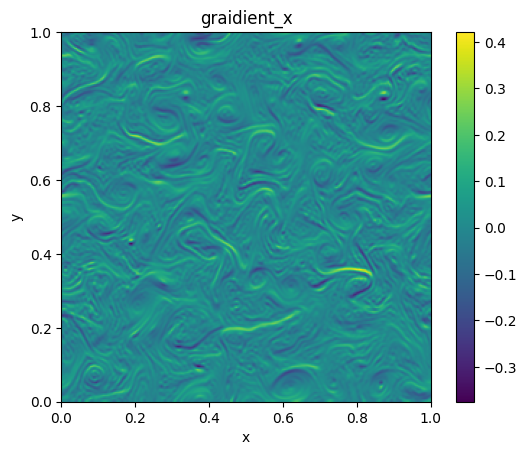

In [5]:
#масштабирование данных до -1 до 1
data = 2 * (data - np.min(data)) / (np.max(data) - np.min(data)) - 1
print(data)

gradient_x = np.gradient(data,axis = 0)
gradient_y = np.gradient(data,axis = 1)
#print(x.shape)
#print(y.shape)

# Визуализация данных
plt.title('max-abs data from pyqg')
plt.xlabel('x')
plt.ylabel('y')
plt.imshow(data, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
plt.colorbar()
plt.show()

plt.title('graidient_x')
plt.xlabel('x')
plt.ylabel('y')
plt.imshow(gradient_x, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
plt.colorbar()
plt.show()

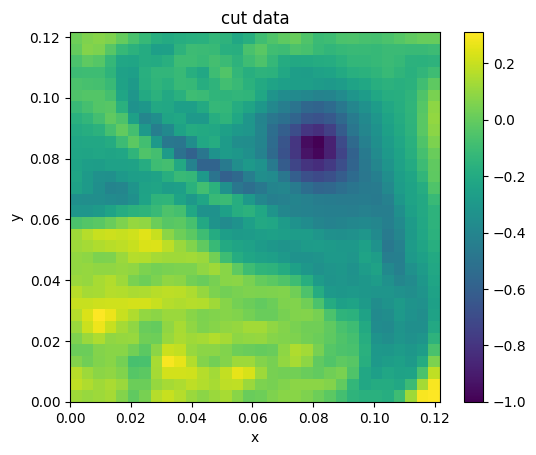

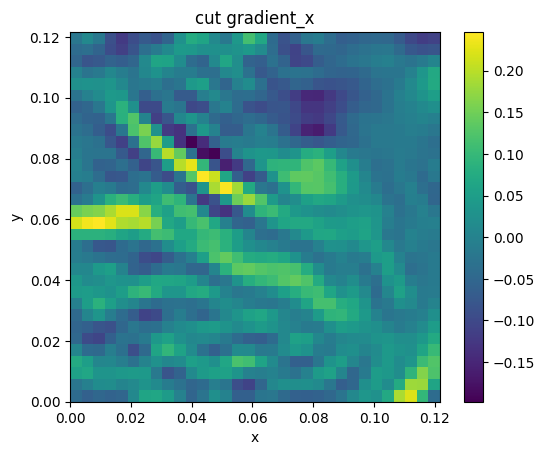

In [6]:
x = x[0:32]
y = y[0:32]
data = data[0:32,0:32]
gradient_x = gradient_x[0:32,0:32]
gradient_y = gradient_y[0:32,0:32]

plt.title('cut data')
plt.xlabel('x')
plt.ylabel('y')
plt.imshow(data, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
plt.colorbar()
plt.show()

plt.title('cut gradient_x')
plt.xlabel('x')
plt.ylabel('y')
plt.imshow(gradient_x, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
plt.colorbar()
plt.show()

In [7]:
data = torch.from_numpy(data)
x = torch.from_numpy(x)
y = torch.from_numpy(y)
gradient_x = torch.from_numpy(np.gradient(data, axis = 0))
gradient_y = torch.from_numpy(np.gradient(data, axis = 1))

In [8]:
#device = torch.device("cpu")
#device = torch.device("cuda")

x = x.float().to(device)
y = y.float().to(device)
data = data.float().to(device)
gradient_x = gradient_x.to(dtype=torch.float32).to(device)
gradient_y = gradient_y.to(dtype=torch.float32).to(device)
data

tensor([[ 0.0232,  0.0562,  0.0725,  ..., -0.0080,  0.0075,  0.0085],
        [ 0.0016,  0.0661,  0.0524,  ..., -0.1101, -0.1094, -0.1016],
        [-0.0597, -0.0162, -0.0375,  ..., -0.1596, -0.1641, -0.1540],
        ...,
        [ 0.1676,  0.1172,  0.0828,  ..., -0.2377, -0.0599,  0.1869],
        [ 0.1838,  0.1562,  0.1238,  ..., -0.1041,  0.1328,  0.2956],
        [ 0.1223,  0.1077,  0.1192,  ...,  0.1249,  0.2985,  0.3094]],
       device='cuda:0')

In [9]:
print(data.shape)
print(y.shape)
print(x.shape)
print(gradient_x.shape)
print(gradient_y.shape)


torch.Size([32, 32])
torch.Size([32])
torch.Size([32])
torch.Size([32, 32])
torch.Size([32, 32])


In [15]:
model = torch.nn.Sequential(
    torch.nn.Linear(2, 512),
    torch.nn.ReLU(),
    torch.nn.Linear(512, 256),
    torch.nn.ReLU(),
    torch.nn.Linear(256, 128),
    torch.nn.ReLU(),
    torch.nn.Linear(128, 64),
    torch.nn.ReLU(),
    torch.nn.Linear(64, 32),
    torch.nn.ReLU(),
    torch.nn.Linear(32, 16),
    torch.nn.ReLU(),
    torch.nn.Linear(16, 8),
    torch.nn.ReLU(),
    torch.nn.Linear(8, 1)
).to(device)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

grid_points = torch.stack(torch.meshgrid(x, y, indexing='ij'), dim=-1).reshape(-1, 2).to(device)

def integrate_gradients(dx, dy, initial_value):
    
    integral_x = torch.zeros_like(dx)
    integral_x[0] = initial_value  
    for i in range(1, dx.shape[0]):
        integral_x[i] = integral_x[i - 1] + ((dx[i] + dx[i - 1])) / 2  
    
    integral_y = torch.zeros_like(dy)
    integral_y[:, 0] = integral_x[:, 0] 
    
    for j in range(1, dy.shape[1]):
        integral_y[:, j] = integral_y[:, j - 1] + ((dy[:, j] + dy[:, j - 1])) / 2  

    return integral_y

lambda_reg = 0.5
losses = []
criterion_losses = []
reg_losses = []

initial_value = data[0, 0]
for epoch in range(50000):
    optimizer.zero_grad()
    output = model(grid_points).reshape(32, 32).to(device)
    gradient_x_nn = _nn_autograd(model, grid_points, var=0, axis=[0]).reshape(32, 32)
    gradient_y_nn = _nn_autograd(model, grid_points, var=0, axis=[1]).reshape(32, 32)
    integral = integrate_gradients(gradient_x_nn, gradient_y_nn, initial_value).to(device)

    loss_criterion = criterion(output, data)
    loss_reg = torch.mean(torch.square(integral - data))
    loss = loss_criterion + lambda_reg * loss_reg

    loss.backward()
    optimizer.step()

    losses.append(loss.item())
    criterion_losses.append(loss_criterion.item())
    reg_losses.append(loss_reg.item())

    if len(losses) > 1:
        var_criterion = torch.var(torch.tensor(criterion_losses))
        var_reg = torch.var(torch.tensor(reg_losses))

        weight_criterion = 1 / var_criterion
        weight_reg = 1 / var_reg

        total_weight = weight_criterion + weight_reg
        weight_criterion = weight_criterion / total_weight
        weight_reg = weight_reg / total_weight

        loss = weight_criterion * loss_criterion + weight_reg * loss_reg

    print('criterion loss = ', loss_criterion)
    print('reg loss = ', loss_reg)
    print(f'Epoch = {epoch}, Loss = {loss.item()}')


criterion loss =  tensor(0.0936, device='cuda:0', grad_fn=<MseLossBackward0>)
reg loss =  tensor(0.0722, device='cuda:0', grad_fn=<MeanBackward0>)
Epoch = 0, Loss = 0.1297493875026703
criterion loss =  tensor(0.0935, device='cuda:0', grad_fn=<MseLossBackward0>)
reg loss =  tensor(0.0699, device='cuda:0', grad_fn=<MeanBackward0>)
Epoch = 1, Loss = 0.09331781417131424
criterion loss =  tensor(0.0933, device='cuda:0', grad_fn=<MseLossBackward0>)
reg loss =  tensor(0.0696, device='cuda:0', grad_fn=<MeanBackward0>)
Epoch = 2, Loss = 0.09296324849128723
criterion loss =  tensor(0.0931, device='cuda:0', grad_fn=<MseLossBackward0>)
reg loss =  tensor(0.0694, device='cuda:0', grad_fn=<MeanBackward0>)
Epoch = 3, Loss = 0.09253872185945511
criterion loss =  tensor(0.0930, device='cuda:0', grad_fn=<MseLossBackward0>)
reg loss =  tensor(0.0667, device='cuda:0', grad_fn=<MeanBackward0>)
Epoch = 4, Loss = 0.09254708886146545
criterion loss =  tensor(0.0928, device='cuda:0', grad_fn=<MseLossBackward0>

0.004228973


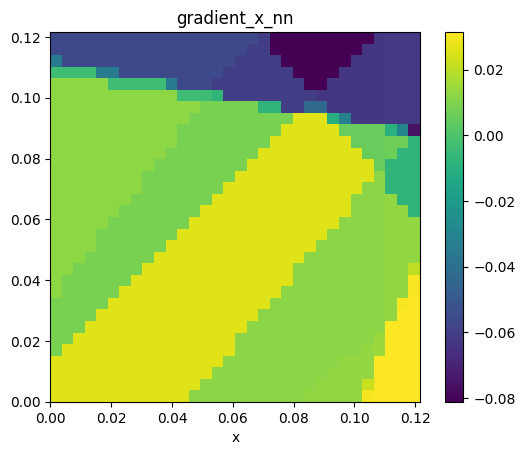

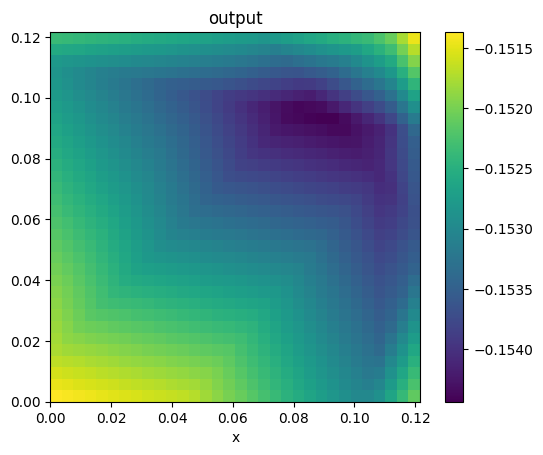

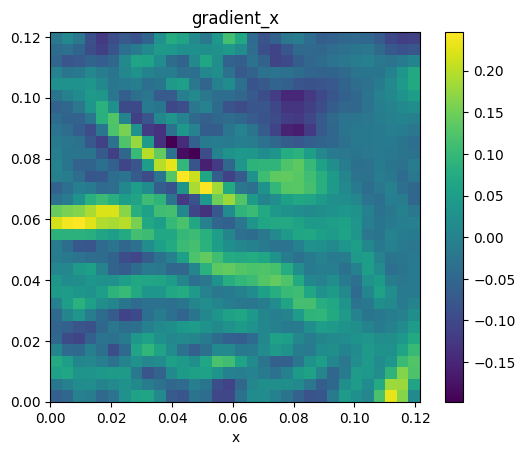

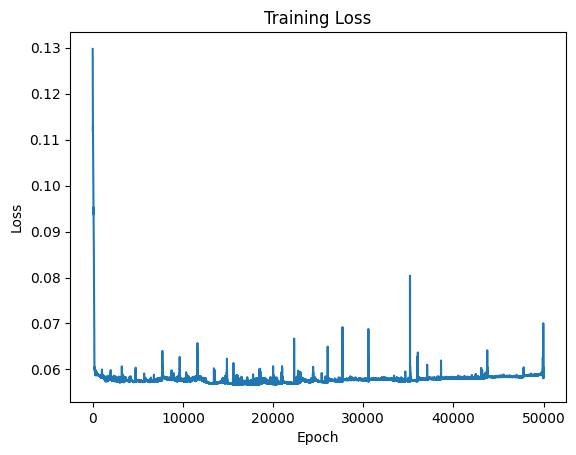

In [16]:
gradient_x_nn = gradient_x_nn.detach().cpu().numpy() 
#gradient_y_nn = gradient_y_nn.detach().cpu().numpy() 

x = x.cpu().numpy() 
y = y.cpu().numpy() 
gradient_x = gradient_x.detach().cpu().numpy() 
#gradient_y = gradient_y.detach().cpu().numpy() 

output = output.detach().cpu().numpy() 

#print(gradient_x.shape)
#print(x.shape)

print((np.square(gradient_x_nn - gradient_x)).mean(axis=None))

plt.imshow(gradient_x_nn, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
plt.title('gradient_x_nn')
plt.xlabel('x')
plt.colorbar()
plt.show()

#plt.imshow(gradient_y_nn, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
#plt.title('gradient_y_nn')
#plt.xlabel('x')
#plt.colorbar()
#plt.show()

plt.imshow(output, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
plt.title('output')
plt.xlabel('x')
plt.colorbar()
plt.show()

plt.imshow(gradient_x, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
plt.title('gradient_x')
plt.xlabel('x')
plt.colorbar()
plt.show()

#plt.imshow(gradient_y, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
#plt.title('gradient_y')
#plt.xlabel('x')
#plt.colorbar()
#plt.show()

plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()

In [88]:
model = torch.nn.Sequential(
    torch.nn.Linear(2, 512),
    torch.nn.ReLU(),
    torch.nn.Linear(512, 256),
    torch.nn.ReLU(),
    torch.nn.Linear(256, 128),
    torch.nn.ReLU(),
    torch.nn.Linear(128, 64),
    torch.nn.ReLU(),
    torch.nn.Linear(64, 32),
    torch.nn.ReLU(),
    torch.nn.Linear(32, 16),
    torch.nn.ReLU(),
    torch.nn.Linear(16, 8),
    torch.nn.ReLU(),
    torch.nn.Linear(8, 1)
).to(device)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

grid_points = torch.stack(torch.meshgrid(x, y, indexing='ij'), dim=-1).reshape(-1, 2).to(device)

def integrate_gradients(dx, dy, initial_value):
    
    integral_x = torch.zeros_like(dx)
    integral_x[0] = initial_value  
    for i in range(1, dx.shape[0]):
        integral_x[i] = integral_x[i - 1] + ((dx[i] + dx[i - 1])) / 2  
    
    integral_y = torch.zeros_like(dy)
    integral_y[:, 0] = integral_x[:, 0] 
    
    for j in range(1, dy.shape[1]):
        integral_y[:, j] = integral_y[:, j - 1] + ((dy[:, j] + dy[:, j - 1])) / 2  

    return integral_y

lambda_reg = 0.5

losses = []
initial_value = data[0, 0]  
for epoch in range(10000):
    optimizer.zero_grad()
    output = model(grid_points).reshape(32, 32).to(device)
    integral = integrate_gradients(gradient_x, gradient_y, initial_value).to(device)
    loss = criterion(output, data)
    loss += lambda_reg * (torch.mean(torch.square(integral - data)))
    loss.backward()
    optimizer.step()
    losses.append(loss.item())
    print('criterion', criterion(output, data))
    print('loss_reg', torch.mean(torch.square(integral - data)))
    print(f'Epoch {epoch}, Loss: {loss.item()}')
    
gradient_x_nn = _nn_autograd(model, grid_points, var=0, axis=[0]).reshape(32, 32)

criterion tensor(0.1215, device='cuda:0', grad_fn=<MseLossBackward0>)
loss_reg tensor(0.0005, device='cuda:0')
Epoch 0, Loss: 0.1218087449669838
criterion tensor(0.1156, device='cuda:0', grad_fn=<MseLossBackward0>)
loss_reg tensor(0.0005, device='cuda:0')
Epoch 1, Loss: 0.11583836376667023
criterion tensor(0.1103, device='cuda:0', grad_fn=<MseLossBackward0>)
loss_reg tensor(0.0005, device='cuda:0')
Epoch 2, Loss: 0.1106048971414566
criterion tensor(0.1048, device='cuda:0', grad_fn=<MseLossBackward0>)
loss_reg tensor(0.0005, device='cuda:0')
Epoch 3, Loss: 0.10503382235765457
criterion tensor(0.0990, device='cuda:0', grad_fn=<MseLossBackward0>)
loss_reg tensor(0.0005, device='cuda:0')
Epoch 4, Loss: 0.0992664024233818
criterion tensor(0.0927, device='cuda:0', grad_fn=<MseLossBackward0>)
loss_reg tensor(0.0005, device='cuda:0')
Epoch 5, Loss: 0.09298153966665268
criterion tensor(0.0854, device='cuda:0', grad_fn=<MseLossBackward0>)
loss_reg tensor(0.0005, device='cuda:0')
Epoch 6, Loss: 0

357.75287


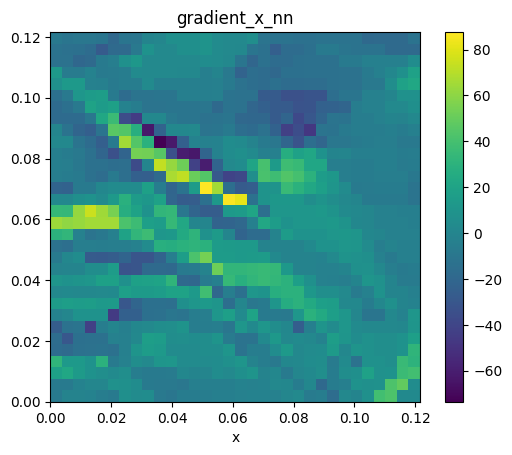

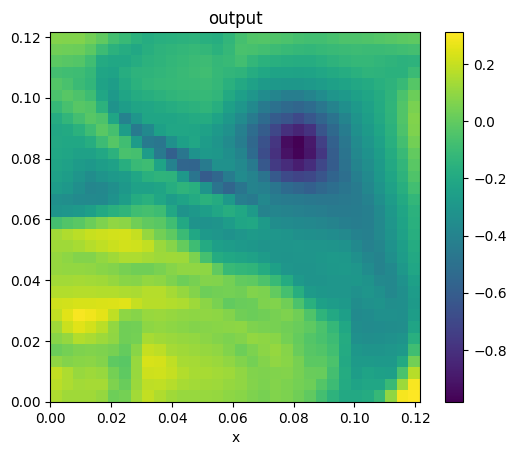

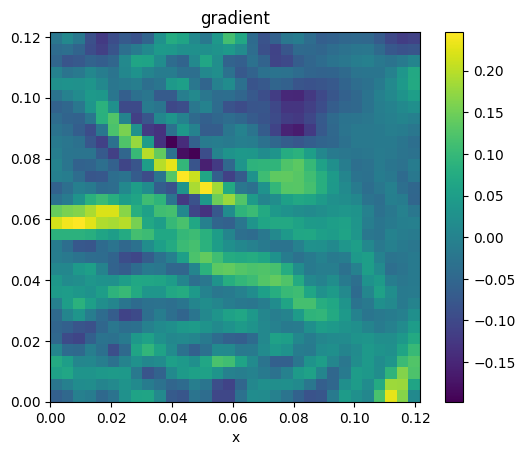

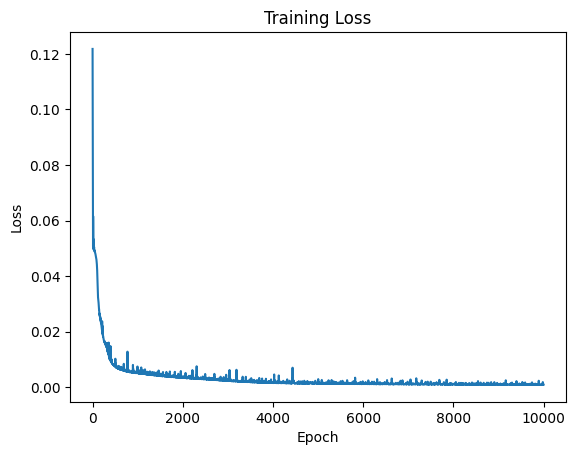

In [89]:
gradient_x_nn = gradient_x_nn.detach().cpu().numpy() 
x = x.cpu().numpy() 
y = y.cpu().numpy() 
gradient_x = gradient_x.detach().cpu().numpy() 
output = output.detach().cpu().numpy() 

#print(gradient_x.shape)
#print(x.shape)

print((np.square(gradient_x_nn - gradient_x)).mean(axis=None))

plt.imshow(gradient_x_nn, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
plt.title('gradient_x_nn')
plt.xlabel('x')
plt.colorbar()
plt.show()

plt.imshow(output, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
plt.title('output')
plt.xlabel('x')
plt.colorbar()
plt.show()

plt.imshow(gradient_x, extent=[np.min(x), np.max(x), np.min(y), np.max(y)])
plt.title('gradient')
plt.xlabel('x')
plt.colorbar()
plt.show()

plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()